# Generación Musical con LSTM

Este proyecto implementa una red neuronal recurrente (LSTM) diseñada para la generación de música algorítmica. El modelo aprende patrones estilísticos a partir de archivos MIDI y genera nuevas composiciones nota por nota.

El pipeline de datos es agnóstico a la cantidad de archivos y su formato de salida es compatible tanto para arquitecturas LSTM como para Transformers.

**Dataset:**
Para este experimento, se utilizaron dos temas icónicos de la saga Final Fantasy: *"Aerith's Theme"* (FF VII) y *"To Zanarkand"* (FF X). Los archivos MIDI fueron curados manualmente y el pipeline incluye una etapa de **Data Augmentation** (transposición tonal) para enriquecer el entrenamiento.

<center>
  <img src="https://raw.githubusercontent.com/jdavibedoya/ff-music-lstm/main/images/ffvii-x.png" width="500" style="border-radius: 10px;">
  <div style="font-style: italic; margin-top: 8px; color: #555;">Fusión artística de FF VII y FF X</div>
</center>
<br>

**Demo:** a continuación, un par de ejemplos de la fusión de estos dos mundos generada por la red::

<div style="display:flex; justify-content:center; gap:50px; align-items:center; margin: 20px 0;">

  <div style="text-align:center;">
    <audio controls src="https://raw.githubusercontent.com/jdavibedoya/ff-music-lstm/main/wav/Session_Seed2_Temp0.75.wav">
    </audio>
    <div style="font-size: 0.9em; margin-top: 5px;">Seed 2 (Temp 0.75)</div>
  </div>
  <br>
  <div style="text-align:center;">
    <audio controls src="https://raw.githubusercontent.com/jdavibedoya/ff-music-lstm/main/wav/Session_Seed1_Temp1.25.wav">
    </audio>
    <div style="font-size: 0.9em; margin-top: 5px;">Seed 1 (Temp 1.25)</div>
  </div>

</div>

## 1 - Paquetes

In [2]:
import matplotlib.pyplot as plt
import numpy as np
import statistics
import os

import tensorflow as tf
from tensorflow.keras.layers import Input, Embedding, LSTM, Dense, Dropout
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import Callback, ModelCheckpoint

from music_data_utils import *
from collections import Counter

## 2 - Procesamiento de Datos

Para este proyecto se desarrolló el módulo `music_data_utils.py`, una librería personalizada que contiene funciones vectorizadas para la codificación (encoding) de archivos MIDI a secuencias numéricas y la decodificación (decoding) inversa.

### 2.1 Tokenización

Los datos de entrenamiento deben ser extraídos de los archivos MIDI y transformados a un formato de **tokens** que el modelo pueda interpretar.

La función `tokenize_midi_folder` utiliza internamente `parse_midi_to_tokens` (del módulo utilitario), la cual convierte la información musical usando una gramática basada en eventos con el formato:

`ON=...;OFF=...;DUR=...`

Donde:
* **ON:** Notas que inician (Note On).
* **OFF:** Notas que terminan (Note Off).
* **DUR:** Duración temporal hasta el siguiente evento.

Adicionalmente, el sistema implementa **cuantización a grid** (para limpiar el ritmo humano), **aumento de datos** y lógica de control para **re-ataques** y **máximo sustain**.

In [3]:
def tokenize_midi_folder(folder_path: str, augment: bool):
    """
    Lee archivos MIDI y los convierte a tokens.

    Args:
        folder_path: Ruta a los archivos .mid
        augment: Si True, genera 12 tonalidades.

    Returns:
        songs_data: Lista de canciones. [Canción][Tonalidad][Tokens]
        median_tempo: Tempo mediano global.
    """
    songs_data = []
    tempos = []

    if not os.path.exists(folder_path):
        print(f"🛑 Error: La carpeta {folder_path} no existe.")
        return [], 120

    files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.mid', '.midi'))]
    print(f"📂 Procesando carpeta: {folder_path} ({len(files)} archivos)")

    for file in files:
        path = os.path.join(folder_path, file)
        try:
            keys = parse_midi_to_tokens(path, augment=augment) # Lista de tuplas: [(tokens, meta), (tokens, meta)...]

            song_keys = []
            for tokens, meta in keys:
                if tokens:
                    song_keys.append(tokens)

            if song_keys:
                songs_data.append(song_keys)

            first_meta = keys[0][1]
            if 'tempo' in first_meta:
                tempos.append(first_meta['tempo'])

        except Exception as e:
            print(f"⚠️ Error leyendo {file}: {e}")

    # Estadísticas
    num_songs = len(songs_data)
    song_tokens = sum(len(song[0]) for song in songs_data)
    total_tokens = sum(len(key) for song in songs_data for key in song)

    median_tempo = 120
    if tempos:
        median_tempo = int(round(statistics.median(tempos)))

    print(f"✅ Tokenización completada.")
    print(f"📚 Canciones procesadas: {num_songs}")
    print(f"🎼 Tokens base (sin augment): {song_tokens}")
    if augment:
      print(f"📝 Gran total de tokens (con augment): {total_tokens}")
    print(f"🎹 Tempo detectado (mediana): {median_tempo} BPM")

    return songs_data, median_tempo

In [4]:
songs_data, median_tempo = tokenize_midi_folder("data/", augment=True)

📂 Procesando carpeta: data/ (2 archivos)
✅ Tokenización completada.
📚 Canciones procesadas: 2
🎼 Tokens base (sin augment): 1037
📝 Gran total de tokens (con augment): 12444
🎹 Tempo detectado (mediana): 94 BPM


### 2.2 Creación del Dataset

La función `prepare_sequences` construye el vocabulario de tokens únicos y genera las ventanas deslizantes (secuencias) para el entrenamiento supervisado.

> **Nota de Ingeniería:** Durante la creación de secuencias, se implementó una lógica de "reinicio" para evitar que el final de una canción (o una variante tonal) se mezcle incorrectamente con el inicio de otra en la misma secuencia de entrenamiento.

In [5]:
def prepare_sequences(songs_data: list[list[list[str]]], sequence_length: int = 32):
    """
    Crea el vocabulario y genera las matrices X, Y.

    Args:
        songs_data: Lista [Canción][Variación][Tokens].
        sequence_length: Longitud de la ventana de contexto.

    Returns:
        X: Matriz numpy (Inputs).
        Y: Matriz numpy (Targets).
        token_to_int: Diccionario mapeo.
        int_to_token: Diccionario reverso.
        vocab_size: Tamaño del vocabulario.
    """

    # 1. Construir vocabulario global (Flattening inteligente)
    print("⏳ Construyendo vocabulario y diccionarios...")

    # Usamos un set para evitar duplicados
    unique_tokens_set = set()
    for song_keys in songs_data:
        for key_tokens in song_keys:
            unique_tokens_set.update(key_tokens)

    unique_tokens = sorted(list(unique_tokens_set))

    token_to_int = {t: i for i, t in enumerate(unique_tokens)}
    int_to_token = {i: t for i, t in enumerate(unique_tokens)}

    vocab_size = len(unique_tokens)
    print(f"📊 Vocabulario: {vocab_size} tokens únicos.")

    # 2. Generar Secuencias (Sliding Window)
    master_X = []
    master_Y = []

    # Contadores para reporte
    sequences_count = 0

    # Bucle 1: Por anción
    for song_keys in songs_data:

        # Bucle 2: Por Tonalidad
        for key_tokens in song_keys:

            # Descartamos si es muy corta
            if len(key_tokens) <= sequence_length:
                continue

            # Vectorizar
            song_indices = [token_to_int[t] for t in key_tokens]

            # Bucle 3: Sliding Window (Dentro de la tonalidad)
            # Generamos pares (input, target) moviendo la ventana paso a paso
            for i in range(0, len(song_indices) - sequence_length):

                # Input: Ventana de tamaño sequence_length
                seq_in = song_indices[i : i + sequence_length]

                # Target: La misma ventana desplazada 1 paso al futuro (Many-to-Many)
                # Esto es ideal para LSTM/Transformers que predicen token a token
                seq_out = song_indices[i + 1 : i + sequence_length + 1]

                master_X.append(seq_in)
                master_Y.append(seq_out)
                sequences_count += 1

    print("⏳ Convirtiendo a Numpy Arrays...")
    X = np.array(master_X)
    Y = np.array(master_Y)

    print(f"📚 Dataset Creado.")
    print(f"   Total de secuencias generadas: {len(X)}")
    print(f"   Shape X: {X.shape}, Shape Y: {Y.shape}")

    return X, Y, token_to_int, int_to_token, vocab_size

In [6]:
# Crear dataset
SEQUENCE_LENGTH = 32
X, Y, token_to_int, int_to_token, vocab_size = prepare_sequences(songs_data, SEQUENCE_LENGTH)

⏳ Construyendo vocabulario y diccionarios...
📊 Vocabulario: 6472 tokens únicos.
⏳ Convirtiendo a Numpy Arrays...
📚 Dataset Creado.
   Total de secuencias generadas: 11676
   Shape X: (11676, 32), Shape Y: (11676, 32)


## 3 - Arquitectura del Modelo

El modelo es una Red Neuronal Recurrente (RNN) diseñada para capturar dependencias temporales a corto y largo plazo:

1.  **Embedding Layer:** Comprime la dimensionalidad del vocabulario de entrada, permitiendo aprender relaciones semánticas entre tokens musicales.
2.  **LSTM Layer 1:** Diseñada para capturar abstracciones de bajo nivel (como acordes o intervalos inmediatos).
3.  **LSTM Layer 2:** Diseñada para capturar abstracciones de alto nivel (como ritmo, estructura de fraseo o progresiones).
4.  **Dense + Softmax:** Capa de salida que entrega la distribución de probabilidad sobre el vocabulario de tokens.

La arquitectura es del tipo **Many-to-Many**, permitiendo que la red calcule el error y actualice pesos en cada paso de tiempo de la secuencia, lo que mejora significativamente la eficiencia del aprendizaje.

<center>
  <img src="https://raw.githubusercontent.com/jdavibedoya/ff-music-lstm/main/images/model_train.png"  width="500" style="border-radius: 10px;">
  <div style="font-style: italic; margin-top: 8px; color: #555">Arquitectura del Modelo (Entrenamiento)</div>
</center>

### 3.1 Configuración Dinámica

La función constructora permite instanciar el modelo en dos modos mediante el argumento `training`:
* **Modo Entrenamiento (`True`):** Entrada `(Batch, TimeSteps)` y `stateful=False` (reinicio de estados por batch).
* **Modo Inferencia (`False`):** Entrada `(1, 1)` y `stateful=True` (preservación de estados para generación continua).

In [7]:
def build_model(vocab_size, embedding_dim, lstm_units, sequence_length, droput, training=False):
    """
    Construye una LSTM para generación musical.
    Soporta modo 'Training' (Stateless, Sliding Window) y 'Inference' (Stateful, Token a Token).

    Args:
        vocab_size: Tamaño del vocabulario
        embedding_dim: Tamaño del vector denso
        lstm_units: Número de neuronas por capa LSTM.
        sequence_length: Longitud de la ventana de contexto.
        droput: Dropout.
        training: True para entrenamiento, False para inferencia (generación).
    """

    # 1. Capa de Entrada
    if training:
        # Modo Entrenamiento:
        input_layer = Input(shape=(sequence_length,)) # (batch_size, sequence_length)
    else:
        # Modo Inferencia (Generación):
        input_layer = Input(batch_shape=(1, 1))

    # 2. Embedding (índices enteros a vectores densos)
    x = Embedding(input_dim=vocab_size, output_dim=embedding_dim)(input_layer)

    # 3. LSTM Capa 1
    x = LSTM(lstm_units, return_sequences=True, stateful=not training)(x)
    x = Dropout(droput)(x)

    # 4. LSTM Capa 2
    x = LSTM(lstm_units, return_sequences=True, stateful=not training)(x) # return_sequences=True SIEMPRE porque es Many-to-Many
    x = Dropout(droput)(x)

    # 5. Salida
    output_layer = Dense(vocab_size, activation='softmax')(x)

    model = Model(inputs=input_layer, outputs=output_layer) # Functional
    return model

### 3.2 Construcción y Compilación del Modelo

En esta celda se instancia y compila el modelo. La selección de las dimensiones de las capas obedece a un equilibrio de diseño para mantener la red ligera (por debajo del millón de parámetros) sin sacrificar su capacidad expresiva:

1.  **Espacio Latente (Embeddings):** Se busca una dimensión suficiente para que la capa de Embedding pueda proyectar el vocabulario en un espacio vectorial denso, capturando relaciones semánticas valiosas entre los tokens.
2.  **Capacidad de Memoria (LSTM):** El número de unidades recurrentes se ajustó para evitar un excesivo "cuello de botella" de información. Si son muy pocas, se comprime demasiado la complejidad de la música y se pierden matices estructurales; si son demasiadas, se corre el riesgo de sobreajuste (*overfitting*).

In [ ]:
EMBEDDING_DIM = 64    # Dimensión del espacio latente
LSTM_UNITS = 64       # Neuronas por capa LSTM
DROPOUT = 0.35
LEARNING_RATE = 0.001
WEIGHTS_FILE = "FF_Music_LSTM.weights.h5" # Archivo de pesos

# Construcción del Modelo
print(f"\n🏗️ Construyendo modelo LSTM (Vocab: {vocab_size}, SeqLen: {SEQUENCE_LENGTH})...")
model_train = build_model(vocab_size=vocab_size,
                          embedding_dim=EMBEDDING_DIM,
                          lstm_units=LSTM_UNITS,
                          sequence_length=SEQUENCE_LENGTH,
                          droput = DROPOUT,
                          training=True)

# Compilación
model_train.compile(
    loss='sparse_categorical_crossentropy', # Sparse porque son enteros, no one-hot
    optimizer=Adam(learning_rate=LEARNING_RATE),
    metrics=['accuracy']
)

model_train.summary()


🏗️ Construyendo modelo LSTM (Vocab: 6472, SeqLen: 32)...


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 32)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ embedding (Embedding)           │ (None, 32, 64)         │       414,208 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm (LSTM)                     │ (None, 32, 64)         │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ lstm_1 (LSTM)                   │ (None, 32, 64)         │        33,024 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 32, 64)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 32, 6472)       │       420,680 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 900,936 (3.44 MB)

 Trainable params: 900,936 (3.44 MB)

 Non-trainable params: 0 (0.00 B)

## 4 - Entrenamiento

### 4.1 Callbacks y Ejecución del Entrenamiento

Antes de iniciar el ajuste (*fit*), se definen dos mecanismos de control:

1.  **ModelCheckpoint:** Guarda los pesos de la red únicamente en la época donde se minimiza la función de pérdida (`loss`), asegurando conservar el mejor modelo posible.
2.  **Custom Logger:** Un callback personalizado para limpiar la salida de la consola, reportando métricas solo al inicio, cada 10 épocas y al final.

In [ ]:
# Callbacks

# 1. Checkpoint
checkpoint = ModelCheckpoint(WEIGHTS_FILE,
                             monitor="loss",
                             save_best_only=True,    # Guardar solo al mejorar
                             save_weights_only=True, # Guardar solo pesos
                             verbose=0,
                             mode="min")

# 2. Logger Personalizado
class SimpleLogger(Callback):
    def on_epoch_end(self, epoch, logs=None):
        # Imprimimos: La primera, cada 10, y la última.
        if (epoch + 1) == 1 or (epoch + 1) % 10 == 0 or (epoch + 1) == self.params['epochs']:
            print(f"⏱️ Época {epoch + 1}/{self.params['epochs']} "
                  f"| 📉 Loss: {logs['loss']:.4f} "
                  f"| 🎯 Acc: {logs['accuracy']:.4f}")



In [ ]:
EPOCHS = 100
BATCH_SIZE = 64

print(f"\n🚀 Iniciando entrenamiento por {EPOCHS} épocas...")
history = model_train.fit(X, Y,
                          epochs=EPOCHS,
                          batch_size=BATCH_SIZE,
                          shuffle=True, # Mezclar ventanas
                          verbose=0,    # Silenciamos la barra de Keras
                          callbacks=[checkpoint, SimpleLogger()])

print(f"\n✅ Entrenamiento finalizado.")


🚀 Iniciando entrenamiento por 100 épocas...
⏱️ Época 1/100 | 📉 Loss: 8.3260 | 🎯 Acc: 0.0032
⏱️ Época 10/100 | 📉 Loss: 5.0825 | 🎯 Acc: 0.0927
⏱️ Época 20/100 | 📉 Loss: 3.1028 | 🎯 Acc: 0.3748
⏱️ Época 30/100 | 📉 Loss: 1.9649 | 🎯 Acc: 0.5832
⏱️ Época 40/100 | 📉 Loss: 1.3341 | 🎯 Acc: 0.7051
⏱️ Época 50/100 | 📉 Loss: 0.9740 | 🎯 Acc: 0.7776
⏱️ Época 60/100 | 📉 Loss: 0.7485 | 🎯 Acc: 0.8255
⏱️ Época 70/100 | 📉 Loss: 0.6004 | 🎯 Acc: 0.8567
⏱️ Época 80/100 | 📉 Loss: 0.4976 | 🎯 Acc: 0.8795
⏱️ Época 90/100 | 📉 Loss: 0.4213 | 🎯 Acc: 0.8974
⏱️ Época 100/100 | 📉 Loss: 0.3669 | 🎯 Acc: 0.9097

✅ Entrenamiento finalizado.


### 4.2 Análisis de Resultados

A continuación, se extrae la información del objeto `history` para visualizar las curvas de aprendizaje. Se grafican las funciones de **Pérdida (Loss)** y **Precisión (Accuracy)** para evaluar la convergencia del modelo.

🏆 Mejor época: 100 | 📉 Loss:: 0.3669067323207855 | 🎯 Acc: 0.9096517562866211 

🏁 Inicio (Época 1):
   - Loss: 8.3260
   - Accuracy: 0.0032

🏁 Final (Época 100):
   - Loss: 0.3669
   - Accuracy: 0.9097 



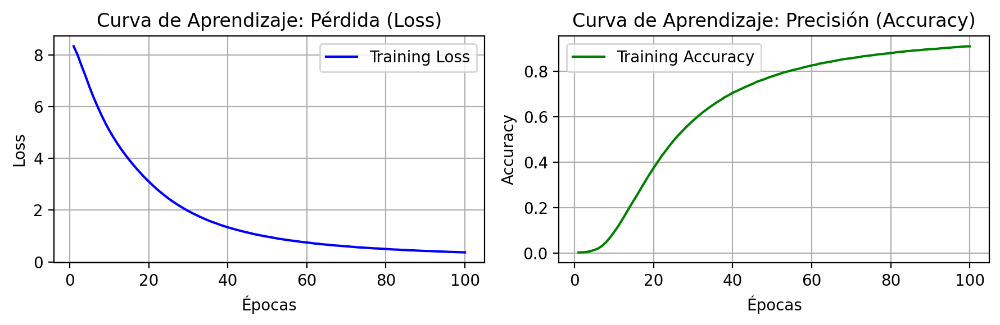

In [ ]:
# 1. Extraer datos de history
loss = history.history['loss']
accuracy = history.history['accuracy']
epochs_range = range(1, len(loss) + 1)

best_epoch = np.argmin(history.history['loss'])
best_loss = history.history['loss'][best_epoch]
best_acc = history.history['accuracy'][best_epoch]
print(f"🏆 Mejor época: {best_epoch + 1} | 📉 Loss:: {best_loss} | 🎯 Acc: {best_acc} \n")

print(f"🏁 Inicio (Época 1):")
print(f"   - Loss: {loss[0]:.4f}")
print(f"   - Accuracy: {accuracy[0]:.4f}")

print(f"\n🏁 Final (Época {len(loss)}):")
print(f"   - Loss: {loss[-1]:.4f}")
print(f"   - Accuracy: {accuracy[-1]:.4f} \n")

# 2. Graficar curvas
plt.figure(figsize=(9, 3))

# Gráfica de Loss
plt.subplot(1, 2, 1)
plt.plot(epochs_range, loss, label='Training Loss', color='blue')
plt.title('Curva de Aprendizaje: Pérdida (Loss)')
plt.xlabel('Épocas')
plt.ylabel('Loss')
plt.legend()
plt.grid(True)

# Gráfica de Accuracy
plt.subplot(1, 2, 2)
plt.plot(epochs_range, accuracy, label='Training Accuracy', color='green')
plt.title('Curva de Aprendizaje: Precisión (Accuracy)')
plt.xlabel('Épocas')
plt.ylabel('Accuracy')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

## 5 - Generación Musical

### 5.1 Modelo de Inferencia

Se reconstruye el modelo con `training=False`. Esto configura la red para recibir una entrada a la vez `(1, 1)` y activa la propiedad `stateful=True`, permitiendo que el contexto musical (los estados internos $c$ y $h$ de las LSTM) se conserve indefinidamente mientras generamos la canción.

Se cargan los mejores pesos obtenidos durante el entrenamiento. Es importante notar que, aunque se define una capa Dropout en la arquitectura, esta debe permanecer inactiva durante la inferencia para resultados deterministas sobre la distribución de probabilidad.

In [8]:
EMBEDDING_DIM = 64    # Dimensión del espacio latente
LSTM_UNITS = 64       # Neuronas por capa LSTM
DROPOUT = 0.35
WEIGHTS_FILE = "FF_Music_LSTM.weights.h5" # Archivo de pesos

# Construcción del Modelo
print("🏗️ Construyendo modelo para Generación (Inferencia)...")
model_inf = build_model(vocab_size=vocab_size,
                        embedding_dim=EMBEDDING_DIM,
                        lstm_units=LSTM_UNITS,
                        sequence_length=SEQUENCE_LENGTH,
                        droput = DROPOUT,
                        training=False)

# Cargar pesos
if os.path.exists(WEIGHTS_FILE):
    model_inf.load_weights(WEIGHTS_FILE)
    print("✅ Pesos cargados exitosamente.")
else:
    print(f"🛑 Error: No encuentro el archivo {WEIGHTS_FILE}")

🏗️ Construyendo modelo para Generación (Inferencia)...
✅ Pesos cargados exitosamente.


### 5.2 Generación Secuencial y Sampling

La función `generate_music` orquesta el proceso de inferencia paso a paso (*sample index*):

1.  **Calentamiento (Warm-up):** Se alimenta la red con una semilla inicial de tokens. Esto "calienta" los estados internos ($c$ y $h$) de las LSTMs, dándoles un contexto musical previo antes de pedir la primera predicción nueva.
2.  **Generación Muestra a Muestra:**
    * El modelo predice la probabilidad del siguiente token $t+1$.
    * Se realiza un **muestreo estocástico** (no determinista) sobre esta distribución.
    * El token seleccionado se convierte en la entrada para el siguiente paso temporal, y el ciclo se repite.

**Control de Temperatura:**
El muestreo utiliza un hiperparámetro `temperature` para modular la entropía de la salida Softmax:
* **Temp < 1.0:** Exagera las diferencias de probabilidad, haciendo la música más conservadora y repetitiva.
* **Temp > 1.0:** Suaviza las diferencias, permitiendo mayor diversidad y "creatividad", con mayor riesgo de disonancia.

<center>
  <img src="https://raw.githubusercontent.com/jdavibedoya/ff-music-lstm/main/images/model_inf.png"  width="500" style="border-radius: 10px;">
  <div style="font-style: italic; margin-top: 8px; color: #555">Flujo de Generación en LSTM (Sample Index)</div>
</center>

In [9]:
# 1. Función de Generación con "Warm-up"
def generate_music(model, seed_tokens, gen_length=250, temperature=1.0):
    """
    Genera música continuando una semilla.

    Args:
        model: Modelo (Stateful).
        seed_tokens: Lista de tokens (ints) iniciales para 'calentar' la memoria.
        gen_length: Cuántos tokens nuevos generar.
        temperature: Creatividad (< 1.0: Conservador, > 1.0: Creativo).
    """

    # A. Resetear memoria
    print(f"🧹 Reseteando estados internos...")
    for layer in model.layers:
        if hasattr(layer, 'reset_states'):
            layer.reset_states()

    # B. Fase de Warm-up (Calentamiento)
    print(f"🎹 Calentando con {len(seed_tokens)} tokens... (Temp: {temperature})")

    # Inicializamos la lista de salida con la semilla original
    generated_indices = list(seed_tokens)

    # Alimentamos toda la semilla token a token para que las LSTMs construyan sus contextos internos.
    for i in range(len(seed_tokens) - 1):
        x = np.array([[seed_tokens[i]]]) # Shape (1, 1)
        # Usamos model(x) en lugar de predict para velocidad.
        # training=False apaga Dropout automáticamente.
        _ = model(x, training=False)

    # El último token de la semilla dispara la generación
    curr_token = np.array([[seed_tokens[-1]]])

    # C. Fase de Generación (Sampling Loop)
    print("🚀 Iniciando improvisación...")
    for _ in range(gen_length):
        # 1. Predecir (Fast forward pass)
        # model(x) devuelve un tensor, lo convertimos a numpy
        preds = model(curr_token, training=False)[0, -1, :].numpy() # Accedemos al último paso de tiempo

        # 2. Aplicar Temperatura
        logits = np.log(preds + 1e-7) / temperature # log(preds) recupera los logits aproximados
        exp_preds = np.exp(logits)
        probs = exp_preds / np.sum(exp_preds) # Re-normalizar

        # 3. Muestrear (Sampling Estocástico)
        next_token = np.random.choice(len(probs), p=probs)

        # 4. Guardar y preparar siguiente paso
        generated_indices.append(int(next_token))
        curr_token = np.array([[next_token]]) # El output es el input del siguiente

    return generated_indices

### 5.3 Semilla Híbrida

Para iniciar la generación (el "calentamiento" de la red), se desarrolló un script heurístico que identificó secuencias de notas comunes en *Aerith's Theme* y *To Zanarkand*. A partir de estas coincidencias, se diseñaron manualmente semillas híbridas que comparten el inicio de nota (*Note On*) pero varían en duración y resolución (*Note Off*), facilitando una transición suave entre estilos.

In [10]:
TEMPERATURE = 0.75
SEED = 2

# 1. Semillas
seed_token_sequences =[['ON=49;OFF=_;DUR=0.333', 'ON=54;OFF=49;DUR=0.333', 'ON=57;OFF=54;DUR=0.333', 'ON=61;OFF=57;DUR=0.500'],
                       ['ON=47;OFF=_;DUR=0.333', 'ON=52;OFF=47;DUR=0.333', 'ON=54;OFF=52;DUR=0.333', 'ON=55;OFF=54;DUR=0.500']]

seed = [token_to_int[t] for t in seed_token_sequences[SEED-1]] # Semilla en índices

# 2. Generar
new_song_indices = generate_music(model_inf, seed, gen_length=250, temperature=TEMPERATURE)

# 3. Decodificar (convertir índices (int) a tokens (str))
new_song_tokens = [int_to_token[idx] for idx in new_song_indices]

# 4. Guardar a MIDI
output_path = f"output/Session_Seed{SEED}_Temp{TEMPERATURE}.mid"
metadata = {'tempo': median_tempo}
tokens_to_midi(new_song_tokens, metadata, output_path)

🧹 Reseteando estados internos...
🎹 Calentando con 4 tokens... (Temp: 0.75)
🚀 Iniciando improvisación...
🔨 Construyendo MIDI en: output/Session_Seed2_Temp0.75.mid ...
✅ Archivo guardado correctamente.


### 5.4 Síntesis de Audio

Los demos de alta calidad presentados al inicio fueron renderizados externamente en un DAW (Ableton Live) usando *Sound Magic Piano One* y *Valhalla Vintage Verb*.

Sin embargo, para propósitos de demostración rápida dentro de este Notebook, se incluye el código para sintetizar los resultados usando `fluidsynth` y `pretty_midi` con bancos de sonido General MIDI (SoundFonts) de Linux.

In [4]:
metadata = {'tempo': 94}
output_path = "output/Session_Seed2_Temp0.75.mid"

In [12]:
# 1. Instalar dependencias
print("⚙️ Instalando dependencias para sintetizar midi...")
#!apt-get install -y fluidsynth > /dev/null
#!pip install pretty_midi pyfluidsynth > /dev/null
print("✅ Instalación completa.")

#2. Sintetizar
import pretty_midi
from IPython.display import Audio

soundfont_path = "/usr/share/sounds/sf2/FluidR3_GM.sf2"

# 2. Cargar el MIDI generado
pm = pretty_midi.PrettyMIDI(output_path) # Cargar MIDI
audio_data = pm.fluidsynth(fs=44100, synthesizer=soundfont_path) # Síntesis

print(f"\n🎶 Síntesis de {output_path.split("/")[-1]}:")
Audio(audio_data, rate=44100, normalize=False)

⚙️ Instalando dependencias para sintetizar midi...
✅ Instalación completa.

🎶 Síntesis de Session_Seed2_Temp0.75.mid:


## 6 - Referencias y Créditos

Este proyecto toma inspiración conceptual del laboratorio *Jazz Improvisation with LSTM* del curso **Sequence Models** (parte de la **Deep Learning Specialization** de DeepLearning.AI).

Sin embargo, la implementación técnica presentada aquí es original y adaptada, incluyendo:
* El diseño de la gramática musical propia (Tokens ON/OFF/DUR).
* El desarrollo del módulo `music_data_utils` para el procesamiento y curación de MIDI.
* La arquitectura específica del modelo.
* La heurística de búsqueda de semillas híbridas.

Referencias base consultadas:
- Ji-Sung Kim, 2016, [deepjazz](https://github.com/jisungk/deepjazz)
- Jon Gillick, Kevin Tang and Robert Keller, 2009. [Learning Jazz Grammars](http://ai.stanford.edu/~kdtang/papers/smc09-jazzgrammar.pdf)